In [83]:
import pandas as pd
import numpy as np

In [84]:
dados = pd.read_csv(r"C:\Users\lucas\Downloads\Dados_totais (1).csv")
dados_generos = pd.read_csv(r"C:\Users\lucas\Downloads\data_by_genres (1).csv")
dados_anos = pd.read_csv(r"C:\Users\lucas\Downloads\data_by_year (1).csv")

In [85]:
dados["year"].unique()

array([2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010,
       2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020],
      dtype=int64)

In [86]:
dados=dados.drop(["explicit","key","mode"],axis =1)
dados_genero=dados_generos.drop(["key","mode"],axis =1)
dados_anos=dados_anos.drop(["key","mode"],axis =1)

In [87]:
dados_anos=dados_anos[dados_anos["year"]>=2000]
dados_anos.reset_index()

,index,year,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity
0,79,2000,0.289323,0.590918,242724.642638,0.625413,0.101168,0.197686,-8.247766,0.089205,118.999323,0.559475,46.684049
1,80,2001,0.286842,0.583318,240307.796010,0.626986,0.107214,0.187026,-8.305095,0.089182,117.765399,0.541479,48.750125
2,81,2002,0.282624,0.576160,239503.283000,0.641270,0.088048,0.193911,-7.686640,0.084308,119.239738,0.542397,48.655500
3,82,2003,0.256471,0.575763,244670.575230,0.660165,0.083049,0.196976,-7.485545,0.093926,120.914622,0.530504,48.626407
4,83,2004,0.280559,0.567680,237378.708037,0.648868,0.077934,0.202199,-7.601655,0.094239,121.290346,0.524489,49.273143
5,84,2005,0.255764,0.572281,237229.588205,0.653209,0.090194,0.190082,-7.466159,0.093334,121.617967,0.532531,50.953333
6,85,2006,0.279986,0.568230,234042.914359,0.650326,0.077701,0.188289,-7.265501,0.085847,121.798615,0.520028,51.313846
7,86,2007,0.254081,0.563414,241049.962564,0.668305,0.072957,0.196127,-7.044536,0.084347,124.087516,0.516794,51.075897
8,87,2008,0.249192,0.579193,240107.315601,0.671461,0.063662,0.198431,-6.843804,0.077356,123.509934,0.527542,50.630179
9,88,2009,0.261929,0.564190,238140.013265,0.670749,0.075872,0.205252,-7.046015,0.085458,123.463808,0.507170,51.440816


Análise Gráfica

In [88]:
import plotly.express as px

In [89]:
fig = px.line(dados_anos, x="year", y="loudness", markers=True, title='Variação do Loudness conforme os anos')
fig.show()

In [90]:
import plotly.graph_objects as go
fig = go.Figure()

fig.add_trace(go.Scatter(x=dados_anos['year'], y=dados_anos['acousticness'],
                    name='Acousticness'))
fig.add_trace(go.Scatter(x=dados_anos['year'], y=dados_anos['valence'],
                    name='Valence'))
fig.add_trace(go.Scatter(x=dados_anos['year'], y=dados_anos['danceability'],
                    name='Danceability'))
fig.add_trace(go.Scatter(x=dados_anos['year'], y=dados_anos['energy'],
                    name='Energy'))
fig.add_trace(go.Scatter(x=dados_anos['year'], y=dados_anos['instrumentalness'],
                    name='Instrumentalness'))
fig.add_trace(go.Scatter(x=dados_anos['year'], y=dados_anos['liveness'],
                    name='Liveness'))
fig.add_trace(go.Scatter(x=dados_anos['year'], y=dados_anos['speechiness'],
                    name='Speechiness'))

fig.show()

In [91]:
fig = px.imshow(dados.corr(numeric_only = True), text_auto=True)
fig.show()

In [92]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

In [93]:
dados_generos1 = dados_generos.drop('genres', axis=1)

In [94]:
SEED = 1224
np.random.seed(SEED)

pca_pipeline = Pipeline([('scaler', StandardScaler()),('PCA',PCA(n_components=2, random_state=SEED))])

In [95]:
genre_embedding_pca= pca_pipeline.fit_transform(dados_generos1) 
projection = pd.DataFrame(columns=['x','y'], data=genre_embedding_pca)

In [96]:
projection

,x,y
0,5.913028,-0.022739
1,2.808443,4.521471
2,-0.753649,-1.297776
3,1.017765,-0.948859
4,0.754944,-1.036756
...,...,...
2968,-0.513290,-0.044401
2969,-3.144862,-1.129388
2970,-0.787237,-1.129867
2971,1.637212,-3.431213


In [97]:
from sklearn.cluster import KMeans

In [98]:
kmeans_pca = KMeans(n_clusters=5, verbose=False, random_state=SEED)
kmeans_pca.fit(projection)

dados_generos['cluster_pca'] = kmeans_pca.predict(projection)
projection['cluster_pca'] = kmeans_pca.predict(projection)

D:\Anaconda\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



In [99]:
projection

,x,y,cluster_pca
0,5.913028,-0.022739,2
1,2.808443,4.521471,2
2,-0.753649,-1.297776,3
3,1.017765,-0.948859,4
4,0.754944,-1.036756,4
...,...,...,...
2968,-0.513290,-0.044401,0
2969,-3.144862,-1.129388,3
2970,-0.787237,-1.129867,3
2971,1.637212,-3.431213,4


In [100]:
projection['generos'] = dados_generos['genres']
projection

,x,y,cluster_pca,generos
0,5.913028,-0.022739,2,21st century classical
1,2.808443,4.521471,2,432hz
2,-0.753649,-1.297776,3,8-bit
3,1.017765,-0.948859,4,[]
4,0.754944,-1.036756,4,a cappella
...,...,...,...,...
2968,-0.513290,-0.044401,0,zolo
2969,-3.144862,-1.129388,3,zouglou
2970,-0.787237,-1.129867,3,zouk
2971,1.637212,-3.431213,4,zurich indie


In [101]:
fig = px.scatter(
    projection, x='x', y='y', color='cluster_pca', hover_data=['x','y','generos'])
fig.show()

In [102]:
pca_pipeline[1].explained_variance_ratio_

array([0.29754668, 0.12118015])

In [103]:
pca_pipeline[1].explained_variance_.sum()

5.445280406272214

In [104]:
from sklearn.preprocessing import OneHotEncoder

ohe= OneHotEncoder(dtype=int)
colunas_ohe= ohe.fit_transform(dados[['artists']]).toarray()
dados2=dados.drop('artists', axis=1)

dados_musica_dummies = pd.concat([dados2, pd.DataFrame(colunas_ohe,columns=ohe.get_feature_names_out(['artists']))], axis=1)
dados_musica_dummies

,valence,year,acousticness,danceability,duration_ms,energy,id,instrumentalness,liveness,loudness,...,artists_Zara Larsson,artists_Zedd,artists_alt-J,artists_blackbear,artists_blink-182,artists_deadmau5,artists_for KING & COUNTRY,artists_fun.,artists_girl in red,artists_iann dior
0,0.285,2000,0.00239,0.429,266773,0.661,3AJwUDP919kvQ9QcozQPxg,0.000121,0.2340,-7.227,...,0,0,0,0,0,0,0,0,0,0
1,0.613,2000,0.14300,0.843,270507,0.806,0I3q5fE6wg7LIfHGngUTnV,0.000000,0.0771,-5.946,...,0,0,0,0,0,0,0,0,0,0
2,0.400,2000,0.00958,0.556,216880,0.864,60a0Rd6pjrkxjPbaKzXjfq,0.000000,0.2090,-5.870,...,0,0,0,0,0,0,0,0,0,0
3,0.543,2000,0.00664,0.545,233933,0.865,6ZOBP3NvffbU4SZcrnt1k6,0.000011,0.1680,-5.708,...,0,0,0,0,0,0,0,0,0,0
4,0.760,2000,0.03020,0.949,284200,0.661,3yfqSUWxFvZELEM4PmlwIR,0.000000,0.0454,-4.244,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20306,0.187,2020,0.57400,0.445,176250,0.330,0PUkanqCGTb6qseXPKOw1F,0.000000,0.1020,-8.121,...,0,0,0,0,0,0,0,0,0,0
20307,0.240,2020,0.81500,0.467,179188,0.429,6Iw6fQVKZi0fWtEQBrTFcP,0.000052,0.1770,-8.689,...,0,0,0,0,0,0,0,0,0,0
20308,0.466,2020,0.31000,0.562,253613,0.686,308prODCCD0O660tIktbUi,0.022500,0.1250,-8.480,...,0,0,0,0,0,0,0,0,0,0
20309,0.522,2020,0.20400,0.598,230600,0.472,2f8y4CuG57UJEmkG3ujd0D,0.000015,0.1080,-10.991,...,0,0,0,0,0,0,0,0,0,0


In [105]:
pca_pipeline = Pipeline([('scaler', StandardScaler()), ('PCA', PCA(n_components=0.7, random_state=SEED))])


music_embedding_pca = pca_pipeline.fit_transform(dados_musica_dummies.drop(['id','name','artists_song'], axis=1))
projection_m = pd.DataFrame(data=music_embedding_pca)

pca_pipeline[1].n_components_

612

In [106]:
kmeans_pca_pipeline = KMeans(n_clusters=50, verbose=False, random_state=SEED)

kmeans_pca_pipeline.fit(projection_m)

dados['cluster_pca'] = kmeans_pca_pipeline.predict(projection_m)
projection_m['cluster_pca'] = kmeans_pca_pipeline.predict(projection_m)

D:\Anaconda\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



In [107]:
projection_m['artist'] = dados['artists']
projection_m['song'] = dados['artists_song']

In [108]:
projection_m

,0,1,2,3,4,5,6,7,8,9,...,605,606,607,608,609,610,611,cluster_pca,artist,song
0,0.174796,0.731252,2.186797,-0.767192,0.594847,0.315968,-0.412322,-0.479171,-2.700668,2.109956,...,-0.009111,0.005154,-0.034027,-0.032617,6.232226e-12,-4.151492e-12,-4.959043e-14,9,Coldplay,Coldplay - Yellow
1,-1.358420,0.052935,-1.789973,1.938444,0.403606,1.023898,-1.172118,0.821698,-1.716897,0.252498,...,-0.031986,0.029708,-0.016322,-0.030234,1.608076e-12,-2.982306e-12,8.809321e-13,23,OutKast,OutKast - Ms. Jackson
2,-0.972077,0.658094,0.757500,-0.277350,-0.400393,0.402941,1.292960,1.839192,-1.562236,1.410677,...,0.017097,0.017361,-0.010979,-0.012781,1.057140e-12,-3.650675e-12,2.399390e-14,23,Linkin Park,Linkin Park - In the End
3,-0.926464,1.292091,0.398499,-0.997738,0.202219,0.620859,-0.527689,1.135529,-1.343893,1.020964,...,0.089337,0.164777,-0.064148,-0.040911,4.690674e-13,-5.290135e-12,-2.676961e-12,23,3 Doors Down,3 Doors Down - Kryptonite
4,-1.710077,-0.383502,-1.258562,1.346428,1.223591,1.744579,0.094311,0.479412,-2.125376,0.389565,...,-0.011937,-0.004081,-0.017478,-0.010033,1.289392e-12,-1.825175e-12,3.694547e-13,23,Eminem,Eminem - The Real Slim Shady
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20306,1.346699,-2.775889,0.986755,-1.704967,0.103935,-0.726582,0.253808,0.520234,-0.064513,0.204971,...,-0.235355,-0.054256,0.016922,-0.125947,3.213497e-11,-1.594839e-11,-8.263053e-12,6,Bazzi,Bazzi - I Don't Think I'm Okay
20307,1.269387,-2.444619,0.971408,-0.115303,-0.719597,-1.823579,-0.545186,-1.475719,-0.338390,0.272129,...,-0.183026,0.074605,0.005622,0.000054,7.661028e-12,8.101442e-12,-5.245018e-12,6,Bryson Tiller,Bryson Tiller - Timeless Interlude
20308,0.781916,-1.164865,0.705256,-0.947160,1.145828,-0.472667,-0.356604,0.972512,0.900317,-0.674016,...,-0.033420,-0.157564,0.213849,-0.065180,4.460198e-11,6.207227e-11,1.094710e-11,6,Fleet Foxes,Fleet Foxes - Sunblind
20309,0.002454,-3.056407,-0.272934,1.436355,-0.604453,0.251492,-1.361710,-0.633245,0.280076,0.521145,...,-0.784640,0.080684,0.038379,0.108493,2.387390e-11,-2.027579e-11,-1.698184e-11,6,Gunna,Gunna - NASTY GIRL / ON CAMERA


In [109]:
fig= px.scatter(
    projection_m, x=0, y=1, color='cluster_pca',hover_data=[0,1,'song'])
fig.show()

In [110]:
pca_pipeline[1].explained_variance_ratio_.sum()

0.7000008463187031

In [111]:
pca_pipeline[1].explained_variance_.sum()

620.9313218688692

In [112]:
fig = px.scatter_3d(
   projection_m, x=0, y=1, z=2, color='cluster_pca',hover_data=['song'])
fig.update_traces(marker_size = 2)
fig.show()

In [154]:
nome_musica = 'Linkin Park - In the End'

In [155]:
from pandas.core.dtypes.cast import cast
from sklearn.metrics.pairwise import euclidean_distances

cluster = list(projection_m[projection_m['song']== nome_musica]['cluster_pca'])[0]
musicas_recomendadas = projection_m[projection_m['cluster_pca'] == cluster][[0,1,'song']]
x_musica = list(projection_m[projection_m['song'] == nome_musica][0])[0]
y_musica = list(projection_m[projection_m['song'] == nome_musica][1])[0]

#Distâncias euclidianas

distancias = euclidean_distances(musicas_recomendadas[[0,1]],[[x_musica, y_musica]])
musicas_recomendadas['id'] = dados['id']
musicas_recomendadas['distancias']= distancias
recomendada = musicas_recomendadas.sort_values('distancias').head(10)
recomendada

,0,1,song,id,distancias
2,-0.972077,0.658094,Linkin Park - In the End,60a0Rd6pjrkxjPbaKzXjfq,0.000000
5623,-0.962159,0.663592,Elefante - De la Noche a la Mañana,2xezpH0r1pT7kcx2TPNsZ0,0.011340
8005,-0.983187,0.652608,Los Tucanes De Tijuana - El Regreso Del Chapo,4baEwCzla3yCyz21uhOFLp,0.012390
5777,-0.988781,0.665065,50 Cent - P.I.M.P. - Snoop Dogg Remix,7D8gRgQ161fqXNOkcanJfa,0.018100
5514,-0.991019,0.662439,Los Tucanes De Tijuana - El Cruzador,2ptlutvYjg7kJorOfThQS5,0.019434
12330,-0.994365,0.657668,50 Cent - Hustler's Ambition,7t67S1XHT4jU0GCkruG34R,0.022292
5771,-0.974458,0.680574,Michael Bublé - Crazy Little Thing Called Love,1RYzDEcBam49OzcAP9YvdX,0.022605
8096,-0.987261,0.678669,Ja Rule - New York,7xXvPyOiFCsB5SSpio5g38,0.025571
8748,-0.997558,0.638003,Jason Aldean - Texas Was You,3XmGUn730lnJnYMUAMhlHk,0.032449
13166,-0.938218,0.655899,The Cab - Numbers,1bDLMtY69Cx6inNN9kaYkk,0.033930


In [156]:
import spotipy
from spotipy.oauth2 import SpotifyOAuth
from spotipy.oauth2 import SpotifyClientCredentials

In [157]:
scope = "user-library-read playlist-modify-private"
OAuth = SpotifyOAuth(
        scope=scope,         
        redirect_uri='http://localhost:5000/callback',
        client_id = '973a7c0271b94a40808b575d3014d494',
        client_secret = '06d70e58e5a746ed843a4abb13a296ee')

In [158]:
client_credentials_manager = SpotifyClientCredentials(client_id = '973a7c0271b94a40808b575d3014d494',client_secret = '06d70e58e5a746ed843a4abb13a296ee')
sp = spotipy.Spotify(client_credentials_manager = client_credentials_manager)


In [159]:
import matplotlib.pyplot as plt
import skimage.io as io

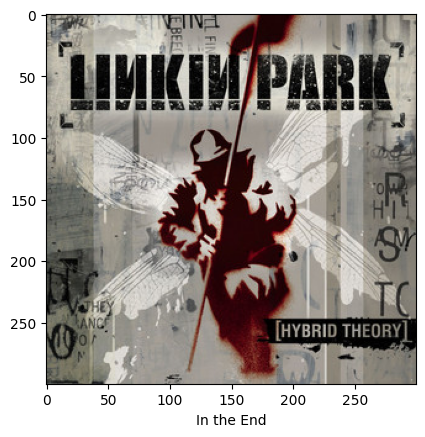

In [160]:
id = dados[dados['artists_song'] == nome_musica]['id'].iloc[0]
track = sp.track(id)
url = track["album"]["images"][1]["url"]
name = track["name"]

image = io.imread(url)
plt.imshow(image)
plt.xlabel(name, fontsize = 10)
plt.show()

In [161]:
def recommend_id(playlist_id):
  url = []
  name = []
  for i in playlist_id:
        track = sp.track(i)
        url.append(track["album"]["images"][1]["url"])
        name.append(track["name"])
  return name, url

In [163]:
name, url= recomend_id(recomendada['id'])

In [165]:
name, url

(['In the End',
  'De la Noche a la Mañana',
  'El Regreso Del Chapo',
  'P.I.M.P. - Snoop Dogg Remix',
  'El Cruzador',
  "Hustler's Ambition",
  'Crazy Little Thing Called Love',
  'New York',
  'Texas Was You',
  'Numbers'],
 ['https://i.scdn.co/image/ab67616d00001e02e2f039481babe23658fc719a',
  'https://i.scdn.co/image/ab67616d00001e02366b39607999ac39405f187e',
  'https://i.scdn.co/image/ab67616d00001e022e42ed62557f9da630b716f9',
  'https://i.scdn.co/image/ab67616d00001e024c88e268c9dc19f79ccdbb97',
  'https://i.scdn.co/image/ab67616d00001e02db880dbf294c2e105cdc192f',
  'https://i.scdn.co/image/ab67616d00001e0269da799626c944aeef9b5e37',
  'https://i.scdn.co/image/ab67616d00001e02b732a522a686bb304a5d3fdf',
  'https://i.scdn.co/image/ab67616d00001e027e81fb67084fb59858a43bf2',
  'https://i.scdn.co/image/ab67616d00001e0230fb8097859c939e15124037',
  'https://i.scdn.co/image/ab67616d00001e02b75ae26c69451f65f59267a1'])

In [166]:
def visualize_songs(name, url):

    plt.figure(figsize=(15,10))
    columns = 5

    for i, u in enumerate(url): 
        # define o ax como o subplot, com a divisão que retorna inteiro do número urls pelas colunas + 1 (no caso, 6)
        ax = plt.subplot(len(url) // columns + 1, columns, i + 1)

        # Lendo a imagem com o Scikit Image
        image = io.imread(u)

        # Mostra a imagem
        plt.imshow(image)

        # Para deixar o eixo Y invisível 
        ax.get_yaxis().set_visible(False)

        # xticks define o local que vamos trocar os rótulos do eixo x, nesse caso, deixar os pontos de marcação brancos
        plt.xticks(color = 'w', fontsize = 0.1)

        # yticks define o local que vamos trocar os rótulos do eixo y, nesse caso, deixar os pontos de marcação brancos
        plt.yticks(color = 'w', fontsize = 0.1)

        # Colocando o nome da música no eixo x
        plt.xlabel(name[i], fontsize = 8)

        # Faz com que todos os parâmetros se encaixem no tamanho da imagem definido
        plt.tight_layout(h_pad=0.7, w_pad=0)

        # Ajusta os parâmetros de layout da imagem.
        # wspace = A largura do preenchimento entre subparcelas, como uma fração da largura média dos eixos.
        # hspace = A altura do preenchimento entre subparcelas, como uma fração da altura média dos eixos.
        plt.subplots_adjust(wspace=None, hspace=None)

        # Remove os ticks - marcadores, do eixo x, sem remover o eixo todo, deixando o nome da música.
        plt.tick_params(bottom = False)

        # Tirar a grade da imagem, gerada automaticamente pelo matplotlib
        plt.grid(visible=None)
    plt.show()
  
     

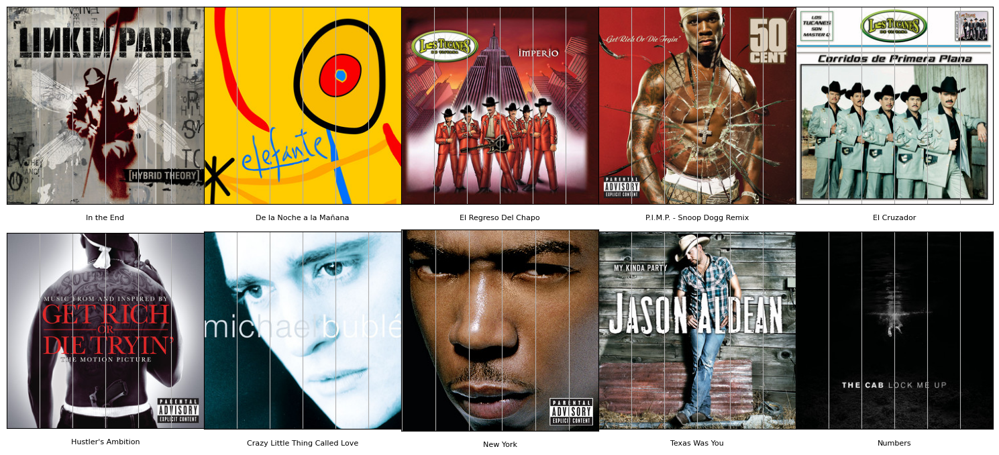

In [167]:
visualize_songs(name, url)
     

In [168]:
import matplotlib
print('matplotlib: {}'.format(matplotlib.__version__))

matplotlib: 3.7.1


In [171]:
def recomendador(nome_musica):
    cluster = list(projection_m[projection_m['song']== nome_musica]['cluster_pca'])[0]
    musicas_recomendadas = projection_m[projection_m['cluster_pca'] == cluster][[0,1,'song']]
    x_musica = list(projection_m[projection_m['song'] == nome_musica][0])[0]
    y_musica = list(projection_m[projection_m['song'] == nome_musica][1])[0]

    #Distâncias euclidianas

    distancias = euclidean_distances(musicas_recomendadas[[0,1]],[[x_musica, y_musica]])
    musicas_recomendadas['id'] = dados['id']
    musicas_recomendadas['distancias']= distancias
    recomendada = musicas_recomendadas.sort_values('distancias').head(10)
   
    playlist_id = recomendada['id']

    url = []
    name = []
    for i in playlist_id:
      track = sp.track(i)
      url.append(track["album"]["images"][1]["url"])
      name.append(track["name"])

# ## Plotando as figuras
    plt.figure(figsize=(15,10))
    columns = 5
    for i, u in enumerate(url):
      ax = plt.subplot(len(url) // columns + 1, columns, i + 1)
      image = io.imread(u)
      plt.imshow(image)
      ax.get_yaxis().set_visible(False)
      plt.xticks(color = 'w', fontsize = 0.1)
      plt.yticks(color = 'w', fontsize = 0.1)
      plt.xlabel(name[i], fontsize = 10)
      plt.tight_layout(h_pad=0.7, w_pad=0)
      plt.subplots_adjust(wspace=None, hspace=None)
      plt.grid(visible=None)
      plt.tick_params(bottom = False)
    plt.show()

     

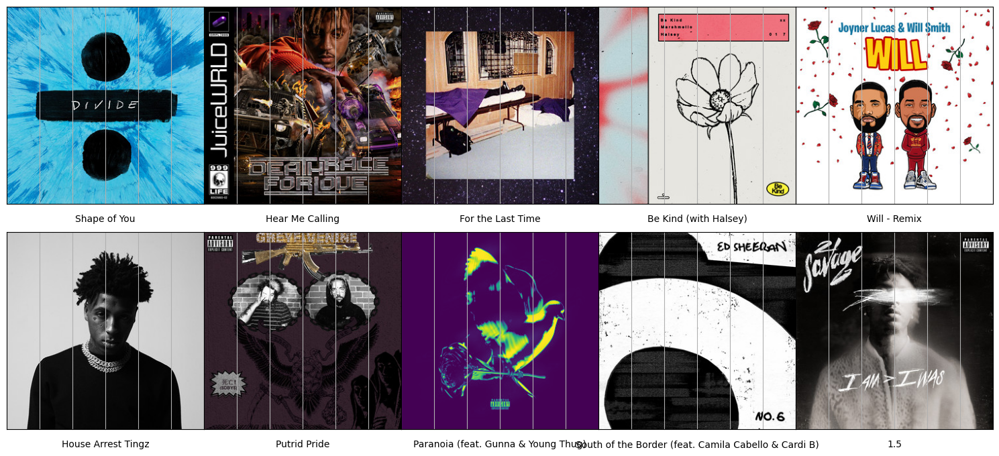

In [172]:
recomendador('Ed Sheeran - Shape of You')